In [15]:
import os
os.chdir('/sam-hq')

In [16]:
pwd

'/sam-hq'

In [1]:
from segment_anything import SamPredictor, sam_model_registry

In [2]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import os
from pathlib import Path
import os.path as osp

import json


In [3]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2)) 

In [4]:
IMG_EXTENSIONS = ('.jpg', '.jpeg', '.png', '.ppm', '.bmp', '.pgm', '.tif',
                  '.tiff', '.webp')

def get_file_list(source_root: str) -> [list, dict]:
    """Get file list.

    Args:
        source_root (str): image or video source path

    Return:
        source_file_path_list (list): A list for all source file.
        source_type (dict): Source type: file or url or dir.
    """
    is_dir = os.path.isdir(source_root)
    is_url = source_root.startswith(('http:/', 'https:/'))
    is_file = os.path.splitext(source_root)[-1].lower() in IMG_EXTENSIONS

    source_file_path_list = []
    if is_dir:
        # when input source is dir
        for file in scandir(source_root, IMG_EXTENSIONS, recursive=True):
            source_file_path_list.append(os.path.join(source_root, file))
    elif is_url:
        # when input source is url
        filename = os.path.basename(
            urllib.parse.unquote(source_root).split('?')[0])
        file_save_path = os.path.join(os.getcwd(), filename)
        print(f'Downloading source file to {file_save_path}')
        torch.hub.download_url_to_file(source_root, file_save_path)
        source_file_path_list = [file_save_path]
    elif is_file:
        # when input source is single image
        source_file_path_list = [source_root]
    else:
        print('Cannot find image file.')

    source_type = dict(is_dir=is_dir, is_url=is_url, is_file=is_file)

    return source_file_path_list, source_type

In [5]:
def scandir(dir_path, suffix=None, recursive=False, case_sensitive=True):
    """Scan a directory to find the interested files.

    Args:
        dir_path (str | :obj:`Path`): Path of the directory.
        suffix (str | tuple(str), optional): File suffix that we are
            interested in. Defaults to None.
        recursive (bool, optional): If set to True, recursively scan the
            directory. Defaults to False.
        case_sensitive (bool, optional) : If set to False, ignore the case of
            suffix. Defaults to True.

    Returns:
        A generator for all the interested files with relative paths.
    """
    if isinstance(dir_path, (str, Path)):
        dir_path = str(dir_path)
    else:
        raise TypeError('"dir_path" must be a string or Path object')

    if (suffix is not None) and not isinstance(suffix, (str, tuple)):
        raise TypeError('"suffix" must be a string or tuple of strings')

    if suffix is not None and not case_sensitive:
        suffix = suffix.lower() if isinstance(suffix, str) else tuple(
            item.lower() for item in suffix)

    root = dir_path

    def _scandir(dir_path, suffix, recursive, case_sensitive):
        for entry in os.scandir(dir_path):
            if not entry.name.startswith('.') and entry.is_file():
                rel_path = osp.relpath(entry.path, root)
                _rel_path = rel_path if case_sensitive else rel_path.lower()
                if suffix is None or _rel_path.endswith(suffix):
                    yield rel_path
            elif recursive and os.path.isdir(entry.path):
                # scan recursively if entry.path is a directory
                yield from _scandir(entry.path, suffix, recursive,
                                    case_sensitive)

    return _scandir(dir_path, suffix, recursive, case_sensitive)

In [6]:
def mask_to_polygon(mask: np.ndarray):
    # Find contours in the binary mask
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the contour with the largest area
   # try:
    largest_contour = max(contours, key=cv2.contourArea)
    #finally:
    #    return contours

    # Extract the vertices of the contour
    #polygon = largest_contour.reshape(-1, 2).tolist()

    return largest_contour

In [7]:
import math 

CONST_DENSITY_RATIO = 2.0

def approxPolyon(cnt, density=0.01):
    rect = cv2.minAreaRect(cnt)
    box = cv2.boxPoints(rect)
    perp = get_perpendicular(box)

    if math.isnan(perp) or perp <= 0.0:
        perp = 1.0

    epsilon = density * cv2.arcLength(cnt, True) / perp
    epsilon = epsilon / CONST_DENSITY_RATIO
    approx = cv2.approxPolyDP(cnt, epsilon, True)

    while len(approx) < 5:
        if density < 0:
            break

        approx = cv2.approxPolyDP(cnt, epsilon, True)
        epsilon = density * cv2.arcLength(cnt, True) / perp
        epsilon = epsilon / CONST_DENSITY_RATIO
        density = density - 0.005

    return approx

def get_perpendicular(min_box):
    pt1, pt2, pt3, pt4 = min_box[0], min_box[1], min_box[2], min_box[3]
    return dist(pt2, pt1, pt3)

def dist(P, A, B):
    area = abs((A[0] - P[0]) * (B[1] - P[1]) - (A[1] - P[1]) * (B[0] - P[0]))
    AB = ((A[0] - B[0]) ** 2 + (A[1] - B[1]) ** 2) ** 0.5
    return area / AB

In [8]:
# 시작

In [9]:
sam = sam_model_registry["vit_h"](checkpoint="/ext/hoya/sam_vit_h_4b8939.pth")
device = "cuda"
sam.to(device=device)
predictor = SamPredictor(sam)

In [10]:
files, _ = get_file_list('/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/')

In [55]:
anno_path = '/ext2/hyunda_results/aimmo/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/'

In [57]:
result_anno_path = '/ext2/hyunda_seg_results/POC_Data_Privacy4/N2207413-230215093354/'

In [59]:
for file in files:
    
    print(file)
    image = cv2.imread(file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    predictor.set_image(image)

    parent_path, filename = os.path.split(file)
    
    file_path = os.path.join(anno_path, filename+'.json')  
    with open(file_path, 'r', encoding='utf-8') as file:
        data = json.load(file)
    print(file_path)
    boxes = []
    for item in data['annotations']:
        points = item['points']
        # bbox 좌표를 (x1, y1, x2, y2) 형식으로 변환
        x1, y1 = points[3]
        x2, y2 = points[1]
        boxes.append([x1, y1, x2, y2])
    
    # PyTorch 텐서로 변환 (디바이스는 예시로 'cpu'로 설정)
    input_boxes = torch.tensor(boxes, device=predictor.device)
    
    transformed_boxes = predictor.transform.apply_boxes_torch(input_boxes, image.shape[:2])
    try:
        masks, _, _ = predictor.predict_torch(
            point_coords=None,
            point_labels=None,
            boxes=transformed_boxes,
            multimask_output=False,
        )
    except:
        continue
    
    for i, mask in enumerate(masks): 
        #print(i)
        try:
            polygons = mask_to_polygon(masks[i][0].cpu().numpy())
            #density = 0.5
            #new_polygons = approxPolyon(polygons, density)
            segmentation_points_2d = polygons.reshape(-1, 2)
            ssegmentation_points_2d = segmentation_points_2d.tolist()
    
            data['annotations'][i]['type'] = 'poly_seg'
            data['annotations'][i]['points'] = ssegmentation_points_2d
        except:
            continue
    data['parent_path'] = "/POC_Data_Privacy/N2207413-230215093354"  
    dst_dir = result_anno_path 
    dst = os.path.join(result_anno_path,filename+'.json')
    if not os.path.exists(dst_dir):
        os.makedirs(dst_dir)
    with open(dst, 'wt', encoding='utf-8') as j:
        json.dump(data, j, indent=4, ensure_ascii=False)
    

/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/img00000840.png
/ext2/hyunda_results/aimmo/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/img00000840.png.json
/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/img00000030.png
/ext2/hyunda_results/aimmo/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/img00000030.png.json
/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/img00001670.png
/ext2/hyunda_results/aimmo/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/img00001670.png.json
/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/img00001150.png
/ext2/hyunda_results/aimmo/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/img00001150.png.json
/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/img00001360.png
/ext2/hyunda_results/aimmo/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/img00001360.png.json
/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/img00001540.png
/ext2/hyunda_results/aimmo/ext/hyundai_seg/POC_Data_P

In [24]:
polygons = mask_to_polygon(masks[3][0].cpu().numpy())
polygons

array([[[1708,  834]],

       [[1707,  835]],

       [[1689,  835]],

       [[1685,  839]],

       [[1685,  841]],

       [[1684,  842]],

       [[1684,  848]],

       [[1685,  849]],

       [[1685,  850]],

       [[1686,  850]],

       [[1688,  852]],

       [[1697,  852]],

       [[1698,  851]],

       [[1704,  851]],

       [[1705,  852]],

       [[1736,  852]],

       [[1737,  851]],

       [[1743,  851]],

       [[1744,  850]],

       [[1745,  850]],

       [[1746,  849]],

       [[1746,  848]],

       [[1747,  847]],

       [[1747,  834]]], dtype=int32)

In [ ]:
# 참조

In [10]:
image = cv2.imread("/ext2/hyundai_seg_slice_img_2/slice_11.png")
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [11]:
predictor.set_image(image)


In [18]:
input_box = np.array([2306, 282, 2517, 333])

In [19]:
masks, _, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

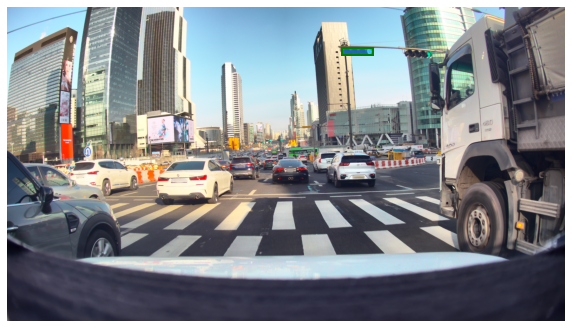

In [20]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
plt.axis('off')
plt.show()

In [21]:
input_box = np.array([2306, 282, 2517, 333])
input_point = np.array([[2480, 307]])
input_label = np.array([0])

In [22]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box=input_box,
    multimask_output=False,
)

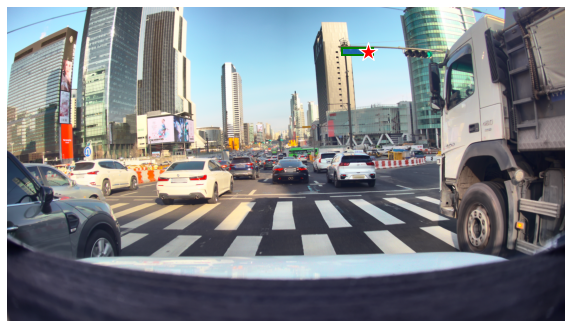

In [23]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

In [ ]:
  "id": "2-bc62c006-1974-11ef-a4a3-0242ac110003",
            "type": "bbox",
            "points": [
                [
                    2097,
                    840
                ],
                [
                    2127,
                    840
                ],
                [
                    2127,
                    809
                ],
                [
                    2097,
                    809
                ]
            ],
            "label": "traffic_sign",
            "attributes": {},
            "score": 0.8831921815872192
        },
        {
            "id": "3-bc62c1fa-1974-11ef-a4a3-0242ac110003",
            "type": "bbox",
            "points": [
                [
                    528,
                    1032
                ],
                [
                    578,
                    1032
                ],
                [
                    578,
                    960
                ],
                [
                    528,
                    960
                ]
            ],
            "label": "traffic_sign",
            "attributes": {},
            "score": 0.8774647116661072
        },
        {
            "id": "4-bc62c3da-1974-11ef-a4a3-0242ac110003",
            "type": "bbox",
            "points": [
                [
                    2736,
                    353
                ],
                [
                    2921,
                    353
                ],
                [
                    2921,
                    291
                ],
                [
                    2736,
                    291
                ]
            ],
            "label": "traffic_light",
            "attributes": {},
            "score": 0.8726804852485657
        },
        {
            "id": "5-bc62c5b0-1974-11ef-a4a3-0242ac110003",
            "type": "bbox",
            "points": [
                [
                    1783,
                    923
                ],
                [
                    1819,
                    923
                ],
                [
                    1819,
                    913
                ],
                [
                    1783,
                    913
                ]
            ],
            "label": "traffic_light",
            "attributes": {},
            "score": 0.8220304846763611
        },
        {
            "id": "6-bc62c786-1974-11ef-a4a3-0242ac110003",
            "type": "bbox",
            "points": [
                [
                    1861,
                    919
                ],
                [
                    1897,
                    919
                ],
                [
                    1897,
                    909
                ],
                [
                    1861,
                    909
                ]
            ],
            "label": "traffic_light",
            "attributes": {},
            "score": 0.8215322494506836
        },
        {
            "id": "7-bc62c95c-1974-11ef-a4a3-0242ac110003",
            "type": "bbox",
            "points": [
                [
                    1691,
                    939
                ],
                [
                    1717,
                    939
                ],
                [
                    1717,
                    933
                ],
                [
                    1691,
                    933
                ]
            ],
            "label": "traffic_light",
            "attributes": {},
            "score": 0.8105239868164062
        },
        {
            "id": "8-bc62cb28-1974-11ef-a4a3-0242ac110003",
            "type": "bbox",
            "points": [
                [
                    1722,
                    937
                ],
                [
                    1736,
                    937
                ],
                [
                    1736,
                    922
                ],
                [
                    1722,
                    922
                ]
            ],
            "label": "traffic_sign",
            "attributes": {},
            "score": 0.788270890712738
        },
        {
            "id": "9-bc62ccfe-1974-11ef-a4a3-0242ac110003",
            "type": "bbox",
            "points": [
                [
                    1745,
                    937
                ],
                [
                    1769,
                    937
                ],
                [
                    1769,
                    930
                ],
                [
                    1745,
                    930
                ]
            ],
            "label": "traffic_light",
            "attributes": {},
            "score": 0.7766389846801758
        },
        {
            "id": "10-bc62ceca-1974-11ef-a4a3-0242ac110003",
            "type": "bbox",
            "points": [
                [
                    1800,
                    937
                ],
                [
                    1815,
                    937
                ],
                [
                    1815,
                    932
                ],
                [
                    1800,
                    932
                ]
            ],
            "label": "traffic_light",
            "attributes": {},
            "score": 0.7096542119979858
        },
        {
            "id": "11-bc62d0c8-1974-11ef-a4a3-0242ac110003",
            "type": "bbox",
            "points": [
                [
                    2880,
                    359
                ],
                [
                    2918,
                    359
                ],
                [
                    2918,
                    289
                ],
                [
                    2880,
                    289
                ]
            ],
            "label": "traffic_light",
            "attributes": {},
            "score": 0.7019319534301758
        },
        {
            "id": "12-bc62d316-1974-11ef-a4a3-0242ac110003",
            "type": "bbox",
            "points": [
                [
                    1197,
                    978
                ],
                [
                    1204,
                    978
                ],
                [
                    1204,
                    964
                ],
                [
                    1197,
                    964
                ]
            ],
            "label": "traffic_sign",
            "attributes": {},
            "score": 0.652336835861206
        },
        {
            "id": "13-bc62d4ec-1974-11ef-a4a3-0242ac110003",
            "type": "bbox",
            "points": [
                [
                    2900,
                    939
                ],
                [
                    2906,
                    939
                ],
                [
                    2906,
                    919
                ],
                [
                    2900,
                    919
                ]
            ],
            "label": "traffic_light",
            "attributes": {},
            "score": 0.4584020972251892
        }
    ]
}

In [ ]:
# json 읽어와서 torch tensor로 변환해주고
# 나온 결과 값 aimmo 포멧으로 바꿔줘야해
# 이미지 폴더로 넣어서 결과 나오게 해줘

In [51]:
import json
import torch

file='/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/img00000060.png'
image = cv2.imread(file)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
predictor.set_image(image)

file_path = '/ext2/hyunda_results/aimmo/ext/hyundai_seg/POC_Data_Privacy/N2207413-230215093354/img00000060.png.json'
with open(file_path, 'r', encoding='utf-8') as file:
    data = json.load(file)

# 파싱된 데이터 출력
print(data['annotations'])

boxes = []
for item in data['annotations']:
    points = item['points']
    # bbox 좌표를 (x1, y1, x2, y2) 형식으로 변환
    x1, y1 = points[3]
    x2, y2 = points[1]
    boxes.append([x2, y2, x1, y1])

# PyTorch 텐서로 변환 (디바이스는 예시로 'cpu'로 설정)
input_boxes = torch.tensor(boxes, device=predictor.device)

# 텐서 출력
print(input_boxes)

[{'id': '1-ef8a9d3a-1cb4-11ef-9acd-0242ac110003', 'type': 'bbox', 'points': [[2150, 761], [2193, 761], [2193, 718], [2150, 718]], 'label': 'traffic_sign', 'attributes': {}, 'score': 0.8800909519195557}, {'id': '2-ef8aa15e-1cb4-11ef-9acd-0242ac110003', 'type': 'bbox', 'points': [[1684, 920], [1701, 920], [1701, 902], [1684, 902]], 'label': 'traffic_sign', 'attributes': {}, 'score': 0.8573779463768005}, {'id': '3-ef8aa4ba-1cb4-11ef-9acd-0242ac110003', 'type': 'bbox', 'points': [[1838, 887], [1882, 887], [1882, 875], [1838, 875]], 'label': 'traffic_light', 'attributes': {}, 'score': 0.8373522162437439}, {'id': '4-ef8aa7f8-1cb4-11ef-9acd-0242ac110003', 'type': 'bbox', 'points': [[1649, 923], [1678, 923], [1678, 916], [1649, 916]], 'label': 'traffic_light', 'attributes': {}, 'score': 0.8219714164733887}, {'id': '5-ef8aaaf0-1cb4-11ef-9acd-0242ac110003', 'type': 'bbox', 'points': [[1740, 892], [1784, 892], [1784, 881], [1740, 881]], 'label': 'traffic_light', 'attributes': {}, 'score': 0.82005

In [10]:
file='/ext2/hyundai_seg_slice_img_6/slice_13.png'
image = cv2.imread(file)
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
predictor.set_image(image)

In [11]:
input_boxes = torch.tensor([
[250, 412, 315, 479]
], device=predictor.device)

In [12]:
input_boxes = input_boxes
input_boxes

tensor([[250, 412, 315, 479]], device='cuda:0')

In [13]:
predictor.device

device(type='cuda', index=0)

In [14]:
transformed_boxes = predictor.transform.apply_boxes_torch(input_boxes, image.shape[:2])
masks, _, _ = predictor.predict_torch(
    point_coords=None,
    point_labels=None,
    boxes=transformed_boxes,
    multimask_output=False,
)

In [15]:
masks.shape  #

torch.Size([1, 1, 640, 640])

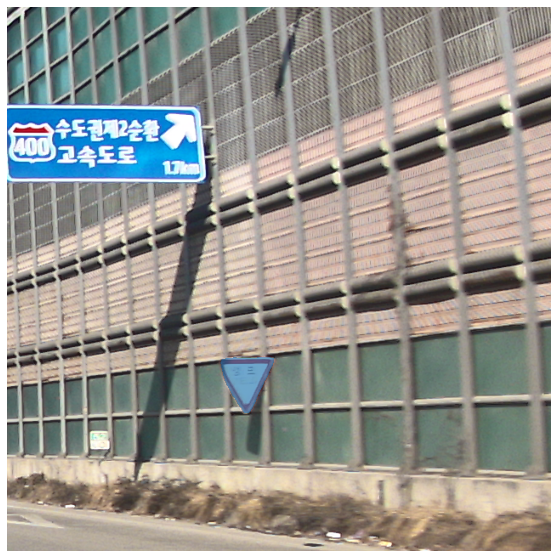

In [16]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask.cpu().numpy(), plt.gca(), random_color=True)
# for box in input_boxes:
#     show_box(box.cpu().numpy(), plt.gca())
plt.axis('off')
plt.show()

In [ ]:
#mask 값을 points로 바꾸고 기존 json에 type을 polyseg, bbox의 points를 seg의 points로 바꿔줘서 저장하기

In [23]:
def mask_to_polygon(mask: np.ndarray):
    # Find contours in the binary mask
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    print(contours)
    # Find the contour with the largest area
    try:
        largest_contour = max(contours, key=cv2.contourArea)
    finally:
        return contours

    # Extract the vertices of the contour
    #polygon = largest_contour.reshape(-1, 2).tolist()

    return largest_contour

In [19]:
len(masks)

1

In [25]:
#print(masks[2][0].cpu().numpy())
polygons = mask_to_polygon(masks[0][0].cpu().numpy())
polygons

(array([[[266, 412]],

       [[265, 413]],

       [[257, 413]],

       [[256, 414]],

       [[253, 414]],

       [[252, 415]],

       [[252, 416]],

       [[251, 417]],

       [[251, 419]],

       [[252, 420]],

       [[252, 424]],

       [[253, 425]],

       [[253, 428]],

       [[254, 429]],

       [[254, 433]],

       [[255, 434]],

       [[255, 436]],

       [[256, 437]],

       [[256, 439]],

       [[257, 440]],

       [[257, 441]],

       [[258, 442]],

       [[258, 444]],

       [[260, 446]],

       [[260, 447]],

       [[261, 448]],

       [[261, 449]],

       [[262, 450]],

       [[262, 451]],

       [[263, 452]],

       [[263, 453]],

       [[264, 454]],

       [[264, 455]],

       [[265, 456]],

       [[265, 457]],

       [[268, 460]],

       [[268, 461]],

       [[270, 463]],

       [[270, 464]],

       [[271, 465]],

       [[271, 466]],

       [[273, 468]],

       [[273, 469]],

       [[276, 472]],

       [[276, 473]],

       [[

(array([[[266, 412]],
 
        [[265, 413]],
 
        [[257, 413]],
 
        [[256, 414]],
 
        [[253, 414]],
 
        [[252, 415]],
 
        [[252, 416]],
 
        [[251, 417]],
 
        [[251, 419]],
 
        [[252, 420]],
 
        [[252, 424]],
 
        [[253, 425]],
 
        [[253, 428]],
 
        [[254, 429]],
 
        [[254, 433]],
 
        [[255, 434]],
 
        [[255, 436]],
 
        [[256, 437]],
 
        [[256, 439]],
 
        [[257, 440]],
 
        [[257, 441]],
 
        [[258, 442]],
 
        [[258, 444]],
 
        [[260, 446]],
 
        [[260, 447]],
 
        [[261, 448]],
 
        [[261, 449]],
 
        [[262, 450]],
 
        [[262, 451]],
 
        [[263, 452]],
 
        [[263, 453]],
 
        [[264, 454]],
 
        [[264, 455]],
 
        [[265, 456]],
 
        [[265, 457]],
 
        [[268, 460]],
 
        [[268, 461]],
 
        [[270, 463]],
 
        [[270, 464]],
 
        [[271, 465]],
 
        [[271, 466]],
 
        [[273, 4

In [ ]:
#해당 포인트 개수 줄이는 것. 아니면 위의 방법 말고 다른 방법있는지 팀원들한테 여쭤보기

In [12]:
import math 

CONST_DENSITY_RATIO = 2.0

def approxPolyon(cnt, density=0.01):
    rect = cv2.minAreaRect(cnt)
    box = cv2.boxPoints(rect)
    perp = get_perpendicular(box)

    if math.isnan(perp) or perp <= 0.0:
        perp = 1.0

    epsilon = density * cv2.arcLength(cnt, True) / perp
    epsilon = epsilon / CONST_DENSITY_RATIO
    approx = cv2.approxPolyDP(cnt, epsilon, True)

    while len(approx) < 5:
        if density < 0:
            break

        approx = cv2.approxPolyDP(cnt, epsilon, True)
        epsilon = density * cv2.arcLength(cnt, True) / perp
        epsilon = epsilon / CONST_DENSITY_RATIO
        density = density - 0.005

    return approx

def get_perpendicular(min_box):
    pt1, pt2, pt3, pt4 = min_box[0], min_box[1], min_box[2], min_box[3]
    return dist(pt2, pt1, pt3)

def dist(P, A, B):
    area = abs((A[0] - P[0]) * (B[1] - P[1]) - (A[1] - P[1]) * (B[0] - P[0]))
    AB = ((A[0] - B[0]) ** 2 + (A[1] - B[1]) ** 2) ** 0.5
    return area / AB

In [107]:
polygons

array([[[2333,  277]],

       [[2332,  278]],

       [[2327,  278]],

       [[2326,  279]],

       [[2323,  279]],

       [[2322,  280]],

       [[2319,  280]],

       [[2318,  281]],

       [[2315,  281]],

       [[2314,  282]],

       [[2313,  282]],

       [[2312,  283]],

       [[2311,  283]],

       [[2308,  286]],

       [[2308,  287]],

       [[2307,  288]],

       [[2307,  290]],

       [[2306,  291]],

       [[2306,  294]],

       [[2305,  295]],

       [[2305,  299]],

       [[2304,  300]],

       [[2304,  309]],

       [[2305,  310]],

       [[2305,  311]],

       [[2306,  312]],

       [[2306,  313]],

       [[2307,  314]],

       [[2307,  316]],

       [[2308,  317]],

       [[2308,  320]],

       [[2309,  321]],

       [[2309,  323]],

       [[2310,  324]],

       [[2310,  325]],

       [[2315,  330]],

       [[2317,  330]],

       [[2318,  331]],

       [[2324,  331]],

       [[2325,  332]],

       [[2335,  332]],

       [[2336,  

In [85]:
density = 0
new_polygons = approxPolyon(polygons, density)

In [86]:
new_polygons

array([[[1882,  879]],

       [[1881,  879]],

       [[1880,  878]],

       [[1879,  878]],

       [[1878,  877]],

       [[1877,  877]],

       [[1876,  876]],

       [[1875,  876]],

       [[1874,  875]],

       [[1872,  875]],

       [[1871,  874]],

       [[1869,  874]],

       [[1868,  873]],

       [[1862,  873]],

       [[1861,  874]],

       [[1857,  874]],

       [[1856,  875]],

       [[1851,  875]],

       [[1850,  876]],

       [[1839,  876]],

       [[1839,  877]],

       [[1838,  878]],

       [[1838,  881]],

       [[1839,  882]],

       [[1839,  883]],

       [[1853,  883]],

       [[1854,  884]],

       [[1855,  884]],

       [[1856,  885]],

       [[1858,  885]],

       [[1859,  886]],

       [[1861,  886]],

       [[1862,  887]],

       [[1867,  887]],

       [[1868,  888]],

       [[1869,  888]],

       [[1870,  887]],

       [[1873,  887]],

       [[1874,  886]],

       [[1875,  886]],

       [[1876,  885]],

       [[1878,  

In [27]:
segmentation_points_2d = polygons[0].reshape(-1, 2)

In [3]:
import cv2
import numpy as np

# 주어진 segmentation polygon points 배열
segmentation_points = np.array([[[2304,  300]],
                                [[2310,  325]],
                                [[2325,  332]],
                                [[2501,  330]],
                                [[2514,  324]],
                                [[2523,  305]],
                                [[2516,  284]],
                                [[2485,  279]],
                                [[2333,  277]],
                                [[2311,  283]]], dtype=np.int32)

# 2차원 배열로 변환
segmentation_points_2d = segmentation_points.reshape(-1, 2)


In [28]:
ssegmentation_points_2d = segmentation_points_2d.tolist()

In [29]:
ssegmentation_points_2d

[[266, 412],
 [265, 413],
 [257, 413],
 [256, 414],
 [253, 414],
 [252, 415],
 [252, 416],
 [251, 417],
 [251, 419],
 [252, 420],
 [252, 424],
 [253, 425],
 [253, 428],
 [254, 429],
 [254, 433],
 [255, 434],
 [255, 436],
 [256, 437],
 [256, 439],
 [257, 440],
 [257, 441],
 [258, 442],
 [258, 444],
 [260, 446],
 [260, 447],
 [261, 448],
 [261, 449],
 [262, 450],
 [262, 451],
 [263, 452],
 [263, 453],
 [264, 454],
 [264, 455],
 [265, 456],
 [265, 457],
 [268, 460],
 [268, 461],
 [270, 463],
 [270, 464],
 [271, 465],
 [271, 466],
 [273, 468],
 [273, 469],
 [276, 472],
 [276, 473],
 [277, 474],
 [277, 475],
 [279, 477],
 [284, 477],
 [286, 475],
 [286, 474],
 [288, 472],
 [288, 471],
 [289, 470],
 [289, 469],
 [290, 468],
 [290, 467],
 [291, 466],
 [291, 465],
 [292, 464],
 [292, 462],
 [293, 461],
 [293, 459],
 [294, 458],
 [294, 457],
 [295, 456],
 [295, 455],
 [296, 454],
 [296, 453],
 [297, 452],
 [297, 451],
 [298, 450],
 [298, 449],
 [299, 448],
 [299, 447],
 [300, 446],
 [300, 445],

In [23]:
#segmentation_points_2d 값을 
data['annotations'][0]['type'] = 'poly_seg'
data['annotations'][0]['points'] = ssegmentation_points_2d

In [24]:
data['annotations']

[{'id': '1-d6b27364-1cb4-11ef-9acd-0242ac110003',
  'type': 'poly_seg',
  'points': [[2304, 300],
   [2310, 325],
   [2325, 332],
   [2501, 330],
   [2514, 324],
   [2523, 305],
   [2516, 284],
   [2485, 279],
   [2333, 277],
   [2311, 283]],
  'label': 'traffic_light',
  'attributes': {},
  'score': 0.884084165096283},
 {'id': '2-d6b27706-1cb4-11ef-9acd-0242ac110003',
  'type': 'bbox',
  'points': [[2097, 840], [2127, 840], [2127, 809], [2097, 809]],
  'label': 'traffic_sign',
  'attributes': {},
  'score': 0.8831921815872192},
 {'id': '3-d6b27986-1cb4-11ef-9acd-0242ac110003',
  'type': 'bbox',
  'points': [[528, 1032], [578, 1032], [578, 960], [528, 960]],
  'label': 'traffic_sign',
  'attributes': {},
  'score': 0.8774647116661072},
 {'id': '4-d6b27be8-1cb4-11ef-9acd-0242ac110003',
  'type': 'bbox',
  'points': [[2736, 353], [2921, 353], [2921, 291], [2736, 291]],
  'label': 'traffic_light',
  'attributes': {},
  'score': 0.8726804852485657},
 {'id': '5-d6b27e36-1cb4-11ef-9acd-0242a

In [83]:

# 폴리곤 그리기
cv2.polylines(image, [segmentation_points_2d], isClosed=True, color=(0, 255, 0), thickness=1)


array([[[138, 187, 237],
        [139, 188, 238],
        [139, 190, 241],
        ...,
        [139, 125, 127],
        [142, 128, 131],
        [143, 129, 132]],

       [[138, 187, 237],
        [139, 188, 238],
        [138, 189, 238],
        ...,
        [138, 127, 128],
        [141, 127, 130],
        [141, 127, 130]],

       [[141, 190, 237],
        [139, 189, 236],
        [138, 189, 238],
        ...,
        [139, 130, 131],
        [141, 127, 130],
        [141, 127, 130]],

       ...,

       [[133, 124, 127],
        [133, 124, 127],
        [129, 122, 125],
        ...,
        [ 21,  23,  39],
        [ 22,  24,  42],
        [ 22,  24,  42]],

       [[133, 126, 126],
        [130, 124, 124],
        [128, 123, 125],
        ...,
        [ 23,  22,  41],
        [ 24,  23,  42],
        [ 23,  22,  41]],

       [[134, 127, 127],
        [132, 125, 125],
        [129, 122, 123],
        ...,
        [ 22,  24,  42],
        [ 22,  24,  42],
        [ 22,  24,  42]]

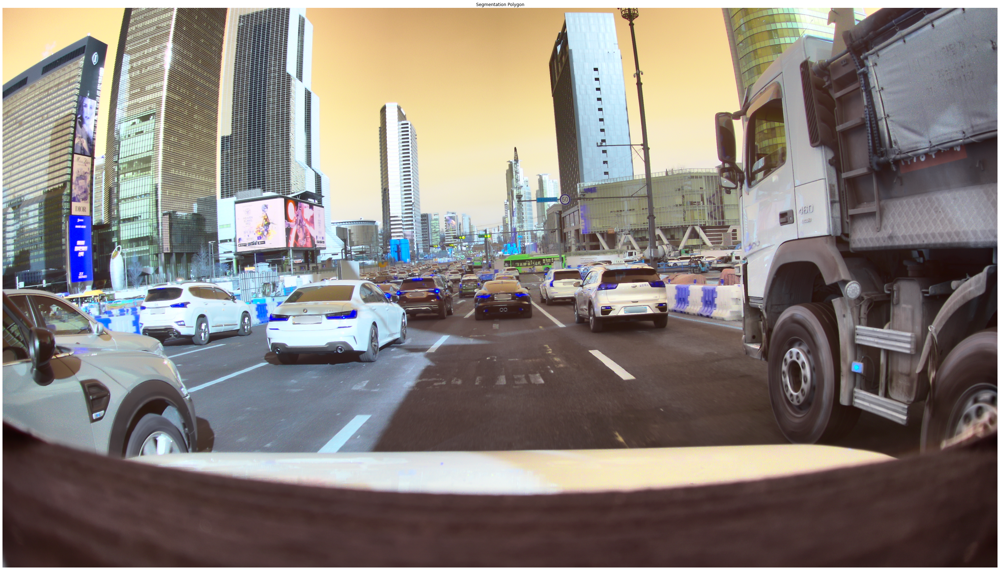

In [84]:
plt.figure(figsize=(50, 50))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Segmentation Polygon')
plt.axis('off')  # 축을 숨깁니다.
plt.show()